# Stable Diffusion演示

In [1]:
# 安装相应的库
# !pip install diffusers==0.21.2 
# !pip install accelerate transformers ftfy bitsandbytes==0.35.0 gradio natsort safetensors xformers

In [1]:
# 导入相关的库
import torch #PyTorch
from diffusers import StableDiffusionPipeline


===================================BUG REPORT===================================
Welcome to bitsandbytes. For bug reports, please submit your error trace to: https://github.com/TimDettmers/bitsandbytes/issues
For effortless bug reporting copy-paste your error into this form: https://docs.google.com/forms/d/e/1FAIpQLScPB8emS3Thkp66nvqwmjTEgxp8Y9ufuWTzFyr9kJ5AoI47dQ/viewform?usp=sf_link
CUDA_SETUP: WARNING! libcudart.so not found in any environmental path. Searching /usr/local/cuda/lib64...
CUDA SETUP: CUDA runtime path found: /usr/local/cuda/lib64/libcudart.so
CUDA SETUP: Highest compute capability among GPUs detected: 8.9
CUDA SETUP: Detected CUDA version 123
CUDA SETUP: TODO: compile library for specific version: libbitsandbytes_cuda123_nocublaslt.so
CUDA SETUP: Defaulting to libbitsandbytes.so...
CUDA SETUP: CUDA detection failed. Either CUDA driver not installed, CUDA not installed, or you have multiple conflicting CUDA libraries!
CUDA SETUP: If you compiled from source, try again 

/home/scc/anaconda3/envs/stableDiffusion/lib/python3.10/site-packages/bitsandbytes/cuda_setup/paths.py:93: UserWarning: /home/scc/anaconda3/envs/stableDiffusion did not contain libcudart.so as expected! Searching further paths...
  warn(
/home/scc/anaconda3/envs/stableDiffusion/lib/python3.10/site-packages/bitsandbytes/cuda_setup/paths.py:27: UserWarning: WARNING: The following directories listed in your path were found to be non-existent: {PosixPath('/usr/local/cuda-12.0/lib64')}
  warn(
/home/scc/anaconda3/envs/stableDiffusion/lib/python3.10/site-packages/bitsandbytes/cuda_setup/paths.py:105: UserWarning: /usr/local/cuda-12.0/lib64 did not contain libcudart.so as expected! Searching further paths...
  warn(
/home/scc/anaconda3/envs/stableDiffusion/lib/python3.10/site-packages/bitsandbytes/cuda_setup/paths.py:27: UserWarning: WARNING: The following directories listed in your path were found to be non-existent: {PosixPath('0'), PosixPath('1')}
  warn(
/home/scc/anaconda3/envs/stableDif

RuntimeError: Failed to import diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion because of the following error (look up to see its traceback):
Failed to import transformers.models.clip.modeling_clip because of the following error (look up to see its traceback):
Failed to import transformers.generation.utils because of the following error (look up to see its traceback):
CUDA SETUP: Setup Failed!

In [3]:
# 我们将使用1.5、2.1两个版本做演示，地址：https://huggingface.co/models?pipeline_tag=text-to-image&sort=downloads

# 加载1.5版本（类似Chatglm2-6B一课）
# 远程下载 “runwayml/stable-diffusion-v1-5”，如果使用远程权重，可能他会定期更新部分权重，需要重新下载，另外因网络问题，可能下载会中断，继续重试即可。
# 镜像存储地址，参考：/home/enpei/.cache/huggingface/diffusers/models--runwayml--stable-diffusion-v1-5/snapshots/1d0c4ebf6ff58a5caecab40fa1406526bca4b5b9


# model_name = "runwayml/stable-diffusion-v1-5" # 在线版
model_name = "./weights/sd1.5" # 离线版

sd15 = StableDiffusionPipeline.from_pretrained(model_name, torch_dtype=torch.float16)


Loading pipeline components...:  14%|█▍        | 1/7 [00:00<00:00,  7.57it/s]`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.
Loading pipeline components...: 100%|██████████| 7/7 [00:01<00:00,  4.83it/s]


In [4]:
# 配置GPU
sd15 = sd15.to('cuda')
sd15.enable_attention_slicing() # 开启注意力切片，节约显存
sd15.enable_xformers_memory_efficient_attention() # 开启Xformers的内存优化注意力，节约显存

In [5]:
# 创建一个prompt
prompt = 'an apple'

In [12]:
# 生成图片
img = sd15(prompt).images

  0%|          | 0/50 [00:00<?, ?it/s]

100%|██████████| 50/50 [00:04<00:00, 10.90it/s]


In [13]:
img

[<PIL.Image.Image image mode=RGB size=512x512>]

In [14]:
# img是一个列表，里面有一个元素，是一个pillow的Image对象
type(img[0])

PIL.Image.Image

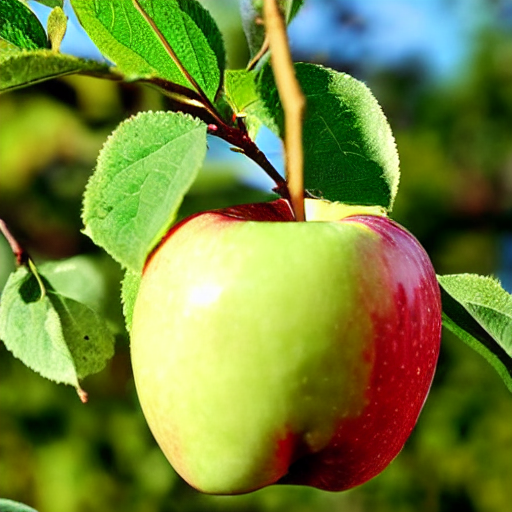

In [15]:
# 可以直接在Jupyter中显示图片（可参考Opencv基础课程部分）
img[0]

In [11]:
# 保存图片
img[0].save('output/sd15_apple.png')

In [16]:
# 也可以转为我们熟悉的opencv(numpy)格式
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [17]:
# 使用numpy格式
# 参数的使用：https://huggingface.co/docs/diffusers/v0.8.0/en/api/pipelines/stable_diffusion#diffusers.StableDiffusionPipeline.__call__
# output_type: pil或者numpy

img_np = sd15(prompt,output_type='numpy').images

100%|██████████| 50/50 [00:04<00:00, 10.81it/s]
/home/enpei/miniconda3/envs/aigc/lib/python3.8/site-packages/diffusers/image_processor.py:340: FutureWarning: the output_type numpy is outdated and has been set to `np`. Please make sure to set it to one of these instead: `pil`, `np`, `pt`, `latent`
  deprecate("Unsupported output_type", "1.0.0", deprecation_message, standard_warn=False)


In [18]:
img_np.shape

(1, 512, 512, 3)

In [19]:
img_np

array([[[[0.26660156, 0.3725586 , 0.3725586 ],
         [0.24853516, 0.38134766, 0.3955078 ],
         [0.27490234, 0.41503906, 0.4194336 ],
         ...,
         [0.26708984, 0.39038086, 0.3930664 ],
         [0.26660156, 0.3725586 , 0.37939453],
         [0.2734375 , 0.34765625, 0.3647461 ]],

        [[0.2529297 , 0.3857422 , 0.3984375 ],
         [0.22631836, 0.3659668 , 0.38476562],
         [0.2409668 , 0.39038086, 0.40429688],
         ...,
         [0.28222656, 0.41625977, 0.41552734],
         [0.26220703, 0.37939453, 0.38427734],
         [0.2709961 , 0.37182617, 0.38061523]],

        [[0.26953125, 0.4152832 , 0.4267578 ],
         [0.2553711 , 0.39868164, 0.4116211 ],
         [0.2529297 , 0.40625   , 0.41674805],
         ...,
         [0.27929688, 0.40722656, 0.41186523],
         [0.27416992, 0.39819336, 0.40014648],
         [0.26757812, 0.3876953 , 0.3876953 ]],

        ...,

        [[0.29736328, 0.5859375 , 0.59765625],
         [0.30126953, 0.62109375, 0.6333008 ]

In [20]:
# 0-1转换为0-255
img_data = np.uint8(img_np[0]*255)

In [21]:
img_data.shape

(512, 512, 3)

(-0.5, 511.5, 511.5, -0.5)

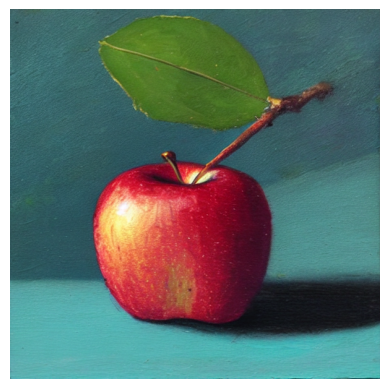

In [22]:
plt.imshow(img_data)
plt.axis('off')

In [23]:

# 转为opencv格式，注意颜色通道的顺序rgb2bgr
img_data = cv2.cvtColor(img_data, cv2.COLOR_RGB2BGR)
# opencv 保存图片
cv2.imwrite('output/sd15_apple_cv.png', img_data)

True

  0%|          | 0/50 [00:00<?, ?it/s]

100%|██████████| 50/50 [00:04<00:00, 10.87it/s]


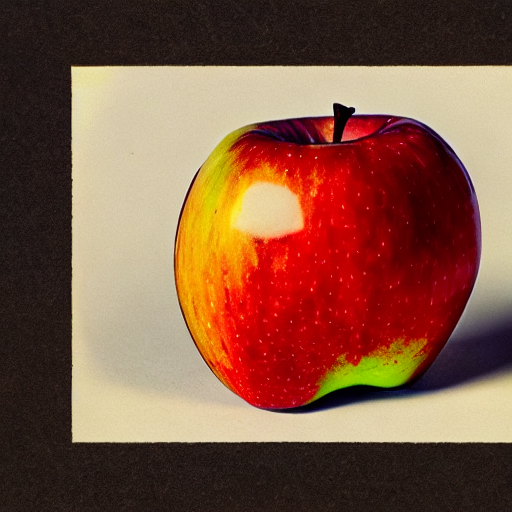

In [26]:
# 另一个例子
prompt = 'photograph of an apple' # 一张苹果的照片
img = sd15(prompt).images[0]
img

100%|██████████| 50/50 [00:04<00:00, 10.96it/s]


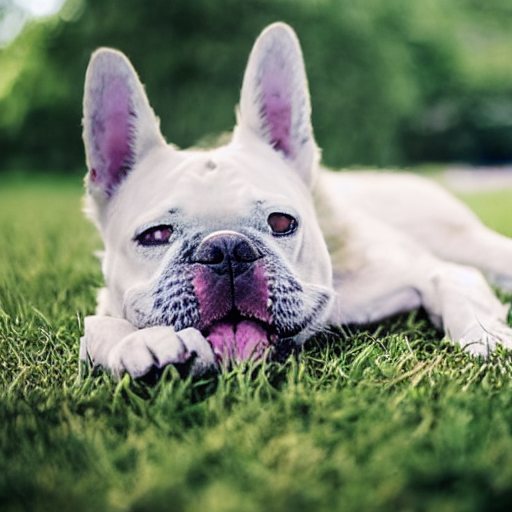

In [27]:
# 另一个例子
prompt = 'photograph of a dog' # 一张狗的照片
img = sd15(prompt).images[0]
img

  0%|          | 0/50 [00:00<?, ?it/s]

100%|██████████| 50/50 [00:04<00:00, 10.89it/s]


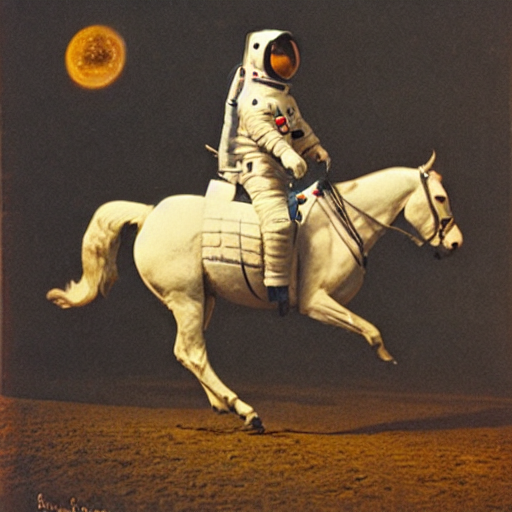

In [31]:
prompt = 'a photograph of an astronaut riding a horse, color' # 一张骑马的宇航员的照片,彩色
img = sd15(prompt).images[0]
img

In [32]:
# 图片的尺寸
img.size

(512, 512)

In [36]:

# num_images_per_prompt：每个prompt生成的图片数量
num_imgs = 3
prompt = 'photograph of an old car' # 一张老爷车的照片
imgs = sd15(prompt, num_images_per_prompt=num_imgs).images

100%|██████████| 50/50 [00:11<00:00,  4.45it/s]


In [34]:
# imgs是一个列表，里面有三个元素，每个元素是一个pillow的Image对象
# 使用subplot显示多张图片

# 做成一个函数
def show_imgs(imgs, num_imgs):
    # 设置图片大小
    plt.figure(figsize=(16, 6))
    for i in range(num_imgs):
        plt.subplot(1, num_imgs, i+1)
        plt.imshow(imgs[i])
        plt.axis('off')
    plt.show()

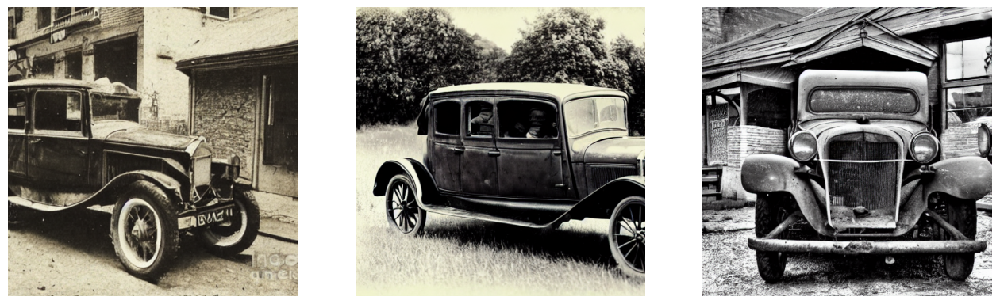

In [37]:
# 显示图片
show_imgs(imgs, num_imgs)

In [38]:
# 也支持list的prompt
base = "a painting of an orange cat reading a book in space, realistic" # 一幅猫在太空读书的写实画

style_list = [", by Van Gogh", # 梵高
      ", by Sandro Botticelli", # 博提切利
      ", by Monet", # 莫奈
      ", by Da Vinci"] # 达芬奇

prompts = []

for m in style_list:
  prompts.append(base + m)

In [39]:
prompts

['a painting of an orange cat reading a book in space, realistic, by Van Gogh',
 'a painting of an orange cat reading a book in space, realistic, by Sandro Botticelli',
 'a painting of an orange cat reading a book in space, realistic, by Monet',
 'a painting of an orange cat reading a book in space, realistic, by Da Vinci']

In [40]:
# 生成图片
imgs = sd15(prompts).images

100%|██████████| 50/50 [00:14<00:00,  3.34it/s]


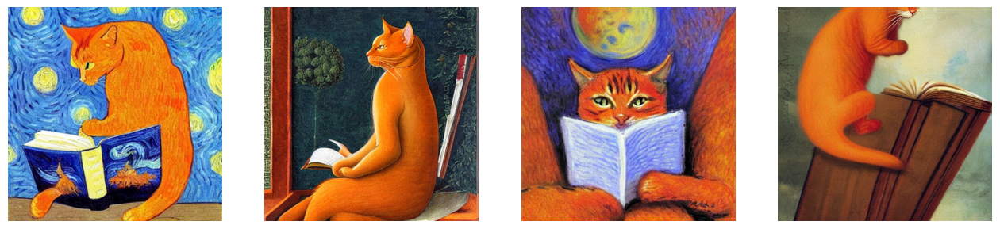

In [41]:
# 显示图片
show_imgs(imgs, 4)

  0%|          | 0/50 [00:00<?, ?it/s]

100%|██████████| 50/50 [00:04<00:00, 10.87it/s]


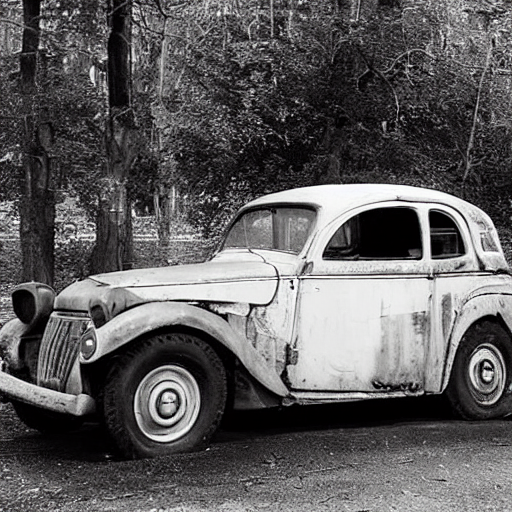

In [44]:

# generator：随机数生成器，控制生成图的确定性

prompt = 'photograph of an old car' # 一张老爷车的照片

seed = 888 # 随机种子，理论上，相同的随机种子，生成的图片是一样的
generator = torch.Generator('cuda').manual_seed(seed) 

img = sd15(prompt, generator=generator).images[0]
img

100%|██████████| 50/50 [00:11<00:00,  4.45it/s]


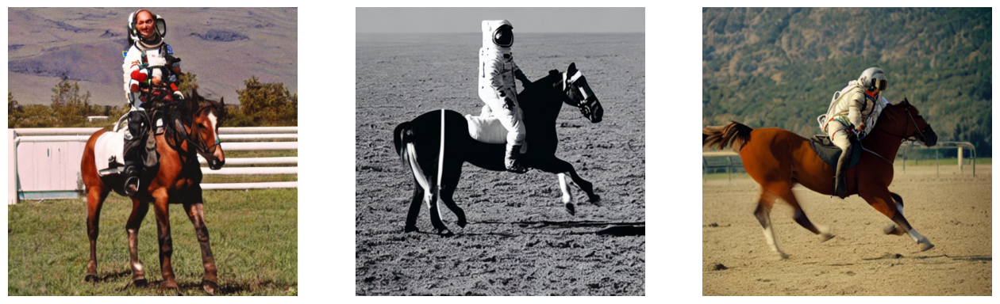

In [45]:

prompt = "a photograph of an astronaut riding a horse" # 一张骑马的宇航员的照片

seed = 999
generator = torch.Generator("cuda").manual_seed(seed)

imgs = sd15(prompt, num_images_per_prompt=num_imgs, generator=generator).images
show_imgs(imgs, num_imgs)

100%|██████████| 50/50 [00:11<00:00,  4.44it/s]


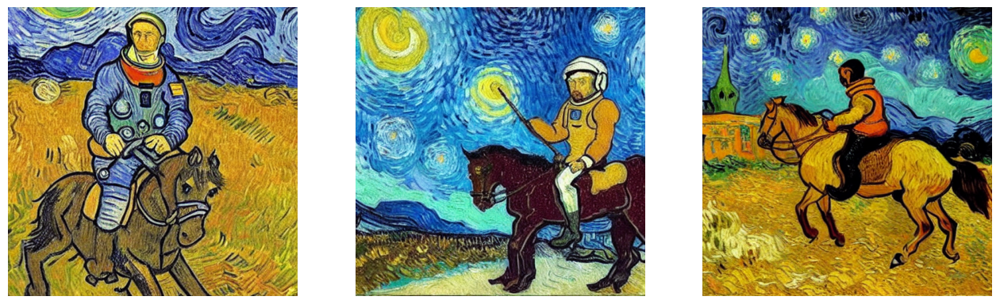

In [46]:
prompt = "van gogh painting of an astronaut riding a horse" # 一张骑马的宇航员的梵高画

seed = 999
generator = torch.Generator("cuda").manual_seed(seed)

imgs = sd15(prompt, num_images_per_prompt=num_imgs, generator=generator).images

show_imgs(imgs, num_imgs)

100%|██████████| 20/20 [00:04<00:00,  4.33it/s]


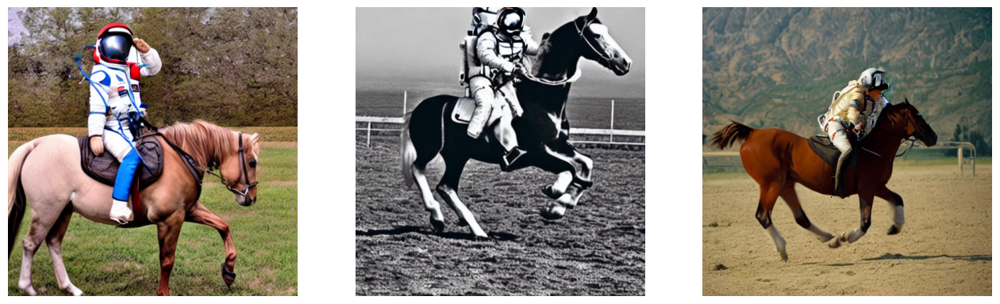

In [47]:
# num_inference_steps: denoising steps，去噪的步数，越多，图片越清晰，但是耗时越长

prompt = "a photograph of an astronaut riding a horse"

seed = 999
generator = torch.Generator("cuda").manual_seed(seed)

steps = 20
imgs = sd15(prompt, num_images_per_prompt=num_imgs, generator=generator, num_inference_steps=steps).images

show_imgs(imgs, num_imgs)

100%|██████████| 100/100 [00:09<00:00, 11.00it/s]


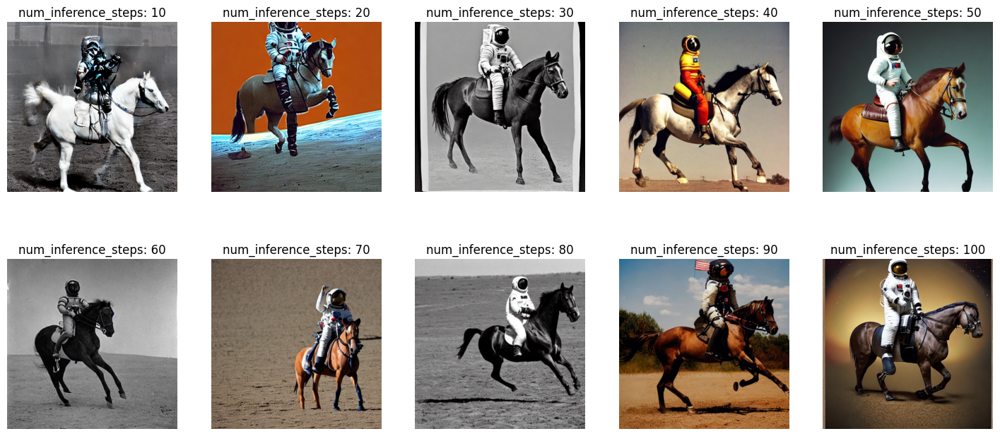

In [48]:
# 分别查看不同步数的图片：10、20、30、40、50、60、70、80、90、100
seed = 888
generator = torch.Generator('cuda').manual_seed(seed)

plt.figure(figsize=(18,8))
for i in range(0, 10):
  n_steps = (i+1) * 10
  
  img = sd15(prompt, generator=generator, num_inference_steps=n_steps).images[0]
  # 分为2行，6列，第i个图
  plt.subplot(2, 5, i+1)
  
  plt.title('num_inference_steps: {}'.format(n_steps))
  plt.imshow(img)
  plt.axis('off')
plt.show()

100%|██████████| 50/50 [00:11<00:00,  4.44it/s]


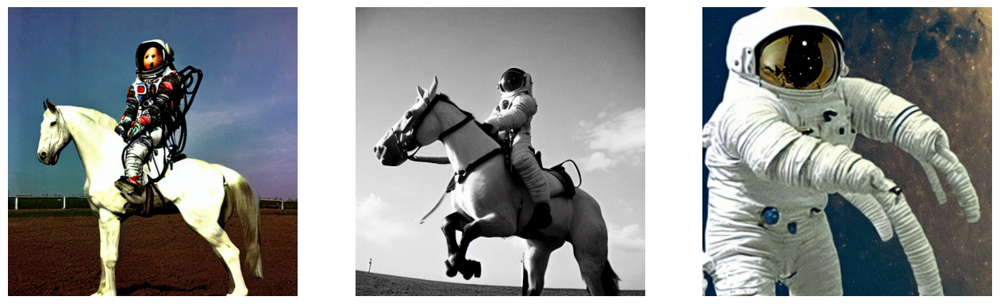

In [49]:
# guidance_scale：指导尺度，控制生成图的多样性
# 更高的guidance_scale度鼓励生成与文本提示紧密相关的图像，通常以降低图像质量为代价。
# 默认值为7.5，最佳值取决于prompt的复杂性和所需的多样性。

prompt = "a photograph of an astronaut riding a horse"
seed = 888
generator = torch.Generator("cuda").manual_seed(seed)

imgs = sd15(prompt, num_images_per_prompt=num_imgs, generator=generator, guidance_scale=7.5).images

show_imgs(imgs, num_imgs)

100%|██████████| 50/50 [00:04<00:00, 10.88it/s]


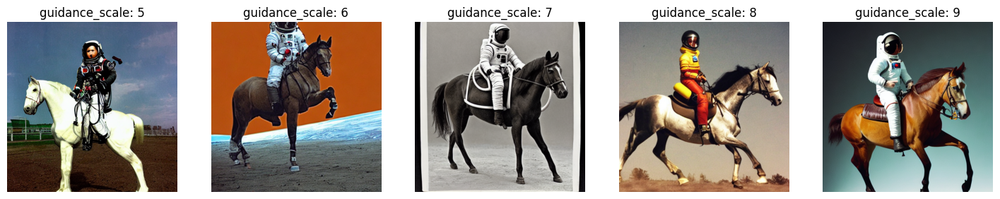

In [50]:
# 查看不同guidance_scale的图片：5、6、7、8、9
seed = 888
generator = torch.Generator('cuda').manual_seed(seed)

plt.figure(figsize=(18,8))
for i in range(1, 6):
  n_guidance = i + 4
  img = sd15(prompt, generator=generator, guidance_scale=n_guidance).images[0]

  plt.subplot(1,5,i)
  plt.title('guidance_scale: {}'.format(n_guidance))
  plt.imshow(img)
  plt.axis('off')

plt.show()

100%|██████████| 50/50 [00:06<00:00,  7.44it/s]


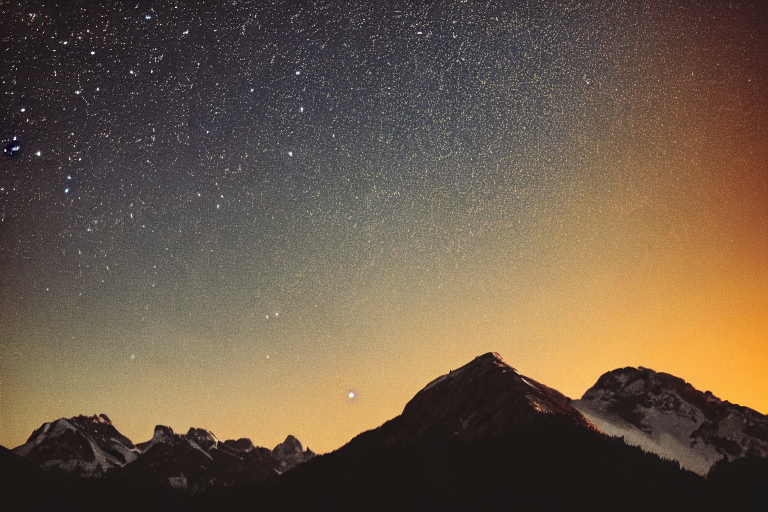

In [51]:

# height和width：生成图片的尺寸，默认512x512
# 横向的图片

prompt = "photograph of a mountain landscape during sunset, stars in the sky" # 一张日落时的山景照片，天空中有星星

seed = 888
generator = torch.Generator("cuda").manual_seed(seed)

h, w = 512, 768

imgs = sd15(prompt, generator=generator, height=h, width=w).images

imgs[0]

100%|██████████| 50/50 [00:06<00:00,  7.44it/s]


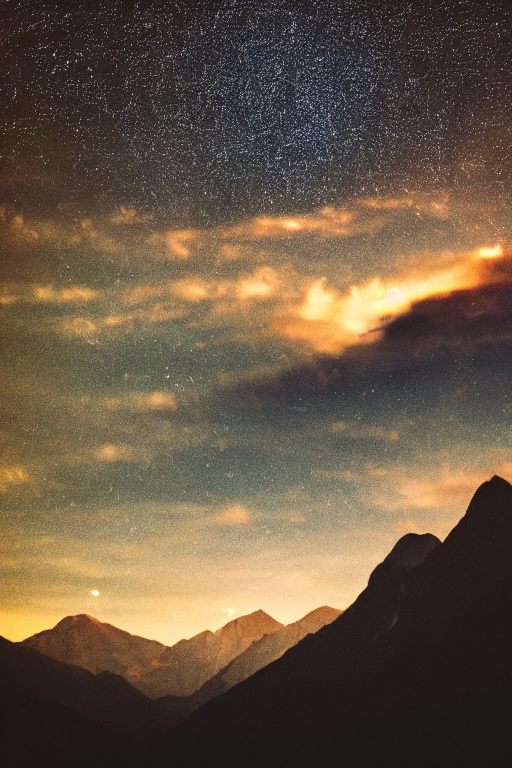

In [52]:
# 纵向的图片

seed = 888
generator = torch.Generator("cuda").manual_seed(seed)

h, w = 768, 512
imgs = sd15(prompt, generator=generator, height=h, width=w).images

imgs[0]

  2%|▏         | 1/50 [00:00<00:22,  2.22it/s]

100%|██████████| 50/50 [00:11<00:00,  4.44it/s]


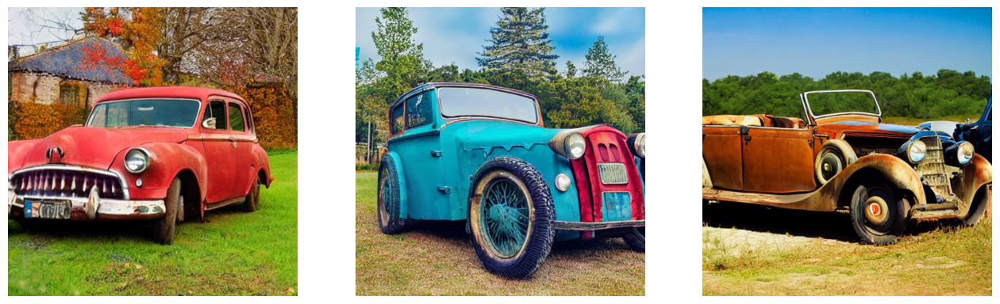

In [54]:
# negative_prompts：负面提示，用于控制生成图的多样性
prompt = 'photograph of an old car' # 一张老爷车的照片
neg_prompt = 'bw photo' # 黑白照片，即移除照片中黑白的照片

seed = 999
generator = torch.Generator("cuda").manual_seed(seed)

imgs = sd15(prompt, generator=generator, num_images_per_prompt=num_imgs, negative_prompt=neg_prompt).images

show_imgs(imgs, num_imgs)

100%|██████████| 50/50 [00:11<00:00,  4.43it/s]


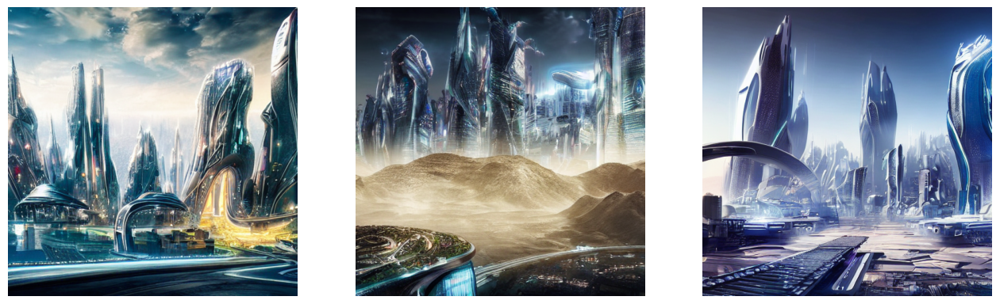

In [55]:


prompt = "photo of a futuristic city on another planet, realistic, full hd" # 一张未来星球上的城市照片，真实的，全高清

seed = 666
generator = torch.Generator("cuda").manual_seed(seed)

imgs = sd15(prompt, generator=generator, num_images_per_prompt=num_imgs).images

show_imgs(imgs, num_imgs)


In [56]:
# 移除建筑
prompt = "photo of a futuristic city on another planet, realistic, full hd" # 一张未来星球上的城市照片，真实的，全高清
neg_prompt = 'buildings' # 建筑


seed = 666
generator = torch.Generator("cuda").manual_seed(seed)

imgs = sd15(prompt, generator=generator, num_images_per_prompt=num_imgs, negative_prompt=neg_prompt).images

show_imgs(imgs, num_imgs)

 14%|█▍        | 7/50 [00:01<00:09,  4.36it/s]